#Install Dependencies


In [ ]:
!git clone https://github.com/WongKinYiu/yolov7
%cd yolov7
!pip install -r requirements.txt

Cloning into 'yolov7'...
remote: Enumerating objects: 1094, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 1094 (delta 0), reused 2 (delta 0), pack-reused 1091
Receiving objects: 100% (1094/1094), 69.85 MiB | 39.09 MiB/s, done.
Resolving deltas: 100% (523/523), done.
/content/yolov7
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 6.2 MB/s 


# Download Our Dataset



In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="##############")
project = rf.workspace("ai-project-dazch").project("final-weapon-dataset")
dataset = project.version(1).download("yolov7")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 808 kB/s 
     |████████████████████████████████| 178 kB 8.3 MB/s 
     |████████████████████████████████| 138 kB 68.6 MB/s 
     |████████████████████████████████| 54 kB 3.9 MB/s 
     |████████████████████████████████| 145 kB 82.3 MB/s 
     |████████████████████████████████| 67 kB 7.5 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=9c9dc1d41b10cd0994cc4c17e2eec13b49301f9c9812595ea9f4d20ae712003a
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: certif

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Final-Weapon-Dataset-1 in yolov7pytorch:: 100%|██████████| 7798/7798 [00:00<00:00, 8453.62it/s]


# Running Testing on test data.
Results are found in the

In [ ]:
!python test.py --data {dataset.location}/data.yaml --img 416 --batch 64 --conf 0.001 --iou 0.65 --device 0 --weights /content/best.pt --name newtest

Namespace(augment=False, batch_size=64, conf_thres=0.001, data='/content/yolov7/Final-Weapon-Dataset-1/data.yaml', device='0', exist_ok=False, img_size=416, iou_thres=0.65, name='newtest', no_trace=False, project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', v5_metric=False, verbose=False, weights=['/content/best.pt'])
YOLOR 🚀 v0.1-116-g8c0bf3f torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36492560 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-mod

# Running Detection on Test Images


In [ ]:
!python detect.py --weights /content/best.pt --source {dataset.location}/test/images


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov7/Final-Weapon-Dataset-1/test/images', update=False, view_img=False, weights=['/content/best.pt'])
YOLOR 🚀 v0.1-116-g8c0bf3f torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36492560 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved!

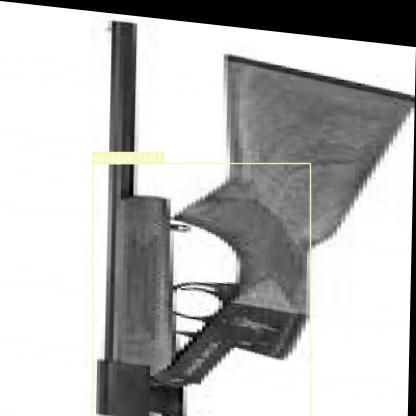

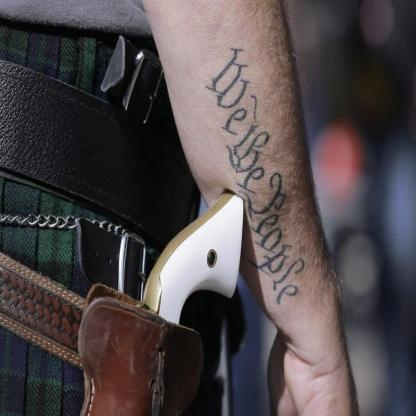

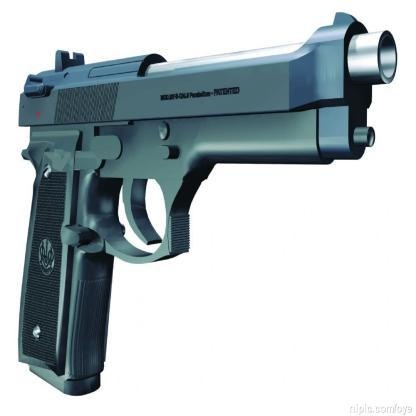

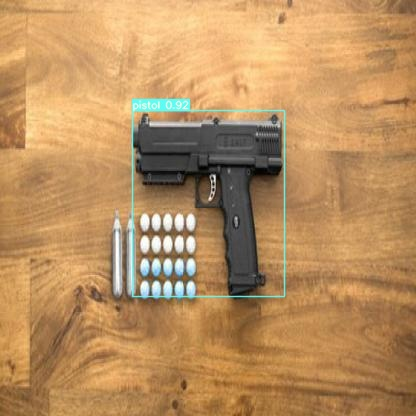

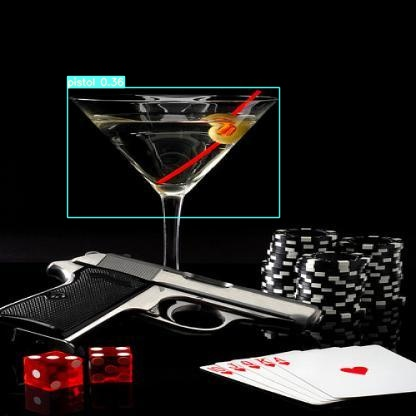

...

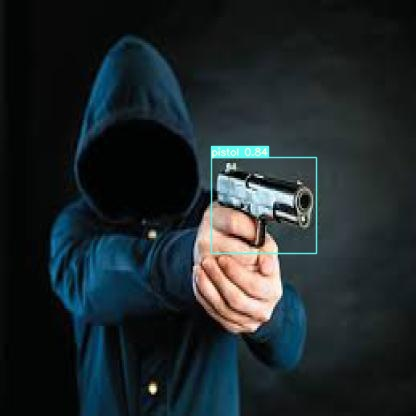

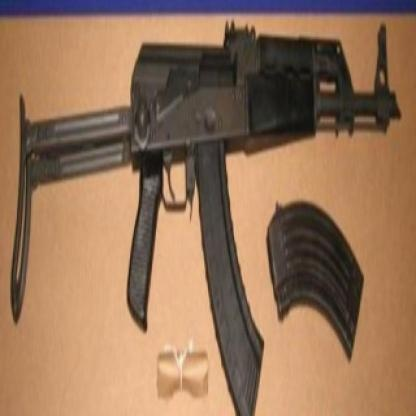

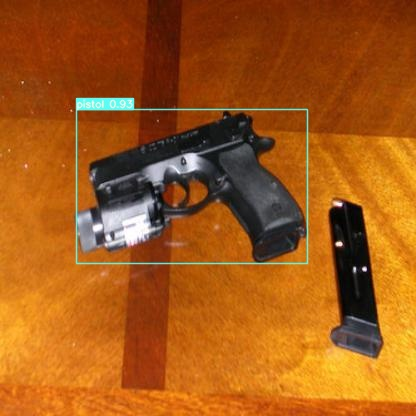

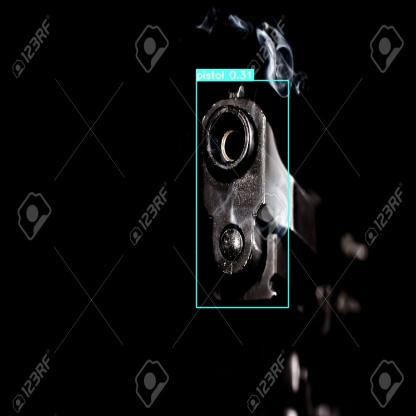

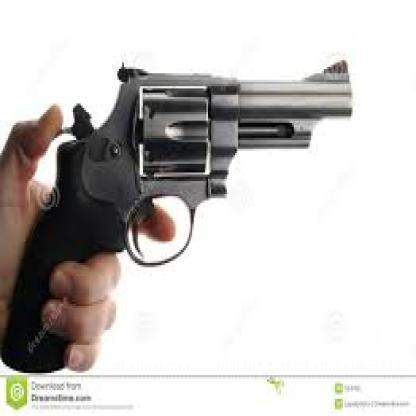

In [ ]:
#Display the images with boundary boxes.

import glob
from IPython.display import Image, display

i = 0
limit = 10000 
for imageName in glob.glob('/content/yolov7/runs/detect/exp1/*.jpg'): 
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1
    